### import modules and dataset

In [1]:
import main, cv2, torch, h5py, cupy as cp, numpy as np, matplotlib.pyplot as plt
from utils.dataset import DataSet, gamma_correct
from utils.helper import compute_svd
from models.denoiser import Denoiser
from inverse.solver import RenderMatrix, linear_inverse
from tqdm.notebook import tqdm

In [2]:
# load dataset
# N = 40
# Specify which dataset to load.
# 'islvrc' refers to the ImageNet / ILSVRC-style dataset stored under utils/dataset/islvrc
# This string is later used inside DataSet.load_dataset(...) to find the correct files.
main.args.data_path = 'islvrc'

# Set the scale factor applied to test images before cropping.
# This typically controls resizing of the image prior to taking a fixed-size crop
# (e.g., resize image to ~38.5% of original size, then extract a 128x128 patch).
main.args.test_scale = [0.385]

# DataSet.load_dataset(...) initializes the dataset object using main.args
#    test_mode=True ensures we load test images (not training images)
#   .test_set() returns the test images as a NumPy array
#    [:40] selects only the first 40 images for this demo
test_set = DataSet.load_dataset(main.args, test_mode=True).test_set()[:40]

# Store the number of test images used
n_sample = 40

# load denoiser
# Specify the file path to the pretrained denoiser weights
# This .pt file contains the learned parameters of a CNN denoiser
main.args.model_path = './assets/conv3_ln.pt'

# Initialize the denoiser network architecture.
# The model structure (number of layers, channels, etc.)
# is determined by settings stored in main.args.
model = Denoiser(main.args)
# Load the pretrained weights into the denoiser model.
# torch.load(...) reads the saved parameters from disk
# load_state_dict(...) assigns them to the model’s layers
model.load_state_dict(torch.load(main.args.model_path))
model = model.eval()


# Choose whether to run computations on a GPU or CPU.
# - If a CUDA-capable GPU is available, use it ('cuda')
# - Otherwise, fall back to the CPU ('cpu')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

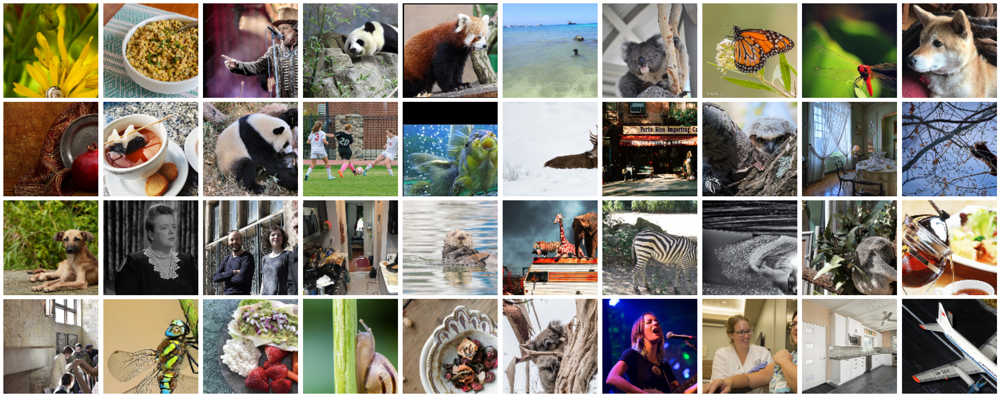

In [3]:
n_row = 4
n_col = 10
fig, axs = plt.subplots(n_row, n_col, figsize=(n_col * 3,
                        n_row * 3), sharex=True, sharey=True)

for idx in range(n_row * n_col):
    axs.flat[idx].imshow(gamma_correct(test_set[idx]))
    axs.flat[idx].axis('off')

fig.tight_layout()

### denoising demo

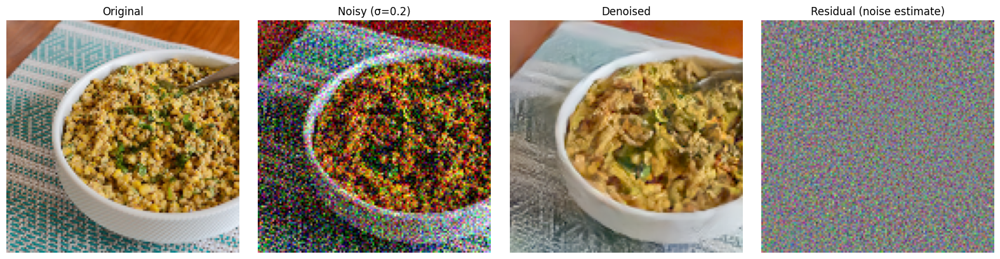

PSNR (noisy): 15.07 dB
PSNR (denoised): 21.81 dB


In [5]:
# Denoising demo: add noise to an image and denoise it
test_idx = 1
test_img = torch.tensor(test_set[test_idx]).permute([2, 0, 1]).unsqueeze(0).to(device)

# Add Gaussian noise
noise_level = 0.2
noisy_img = test_img + torch.randn_like(test_img).to(device) * noise_level

# Denoise using the model (model predicts residual/noise)
model = model.to(device)
with torch.no_grad():
    residual = model(noisy_img)
    denoised_img = noisy_img - residual

# Convert to numpy for visualization
original_np = test_img.squeeze(0).permute([1, 2, 0]).cpu().numpy()
noisy_np = noisy_img.squeeze(0).permute([1, 2, 0]).cpu().numpy()
denoised_np = denoised_img.squeeze(0).permute([1, 2, 0]).cpu().numpy()
residual_np = residual.squeeze(0).permute([1, 2, 0]).cpu().numpy()

# Normalize residual for visualization
residual_np = (residual_np - residual_np.min()) / (residual_np.max() - residual_np.min())

# Plot
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(gamma_correct(np.clip(original_np, 0, 1)))
axs[0].set_title('Original')
axs[1].imshow(np.clip(noisy_np, 0, 1))
axs[1].set_title(f'Noisy (σ={noise_level})')
axs[2].imshow(gamma_correct(np.clip(denoised_np, 0, 1)))
axs[2].set_title('Denoised')
axs[3].imshow(residual_np)
axs[3].set_title('Residual (noise estimate)')

for ax in axs:
    ax.axis('off')
plt.tight_layout()
plt.show()

# Print PSNR
from skimage.metrics import peak_signal_noise_ratio as psnr
print(f"PSNR (noisy): {psnr(original_np, np.clip(noisy_np, 0, 1)):.2f} dB")
print(f"PSNR (denoised): {psnr(original_np, np.clip(denoised_np, 0, 1)):.2f} dB")

### reconstruction demo

In [6]:
# Random sampling matrix reconstruction demo

im_dim = 128 * 128 * 3  # 49152
msmt_dim = im_dim // 20  # (5% of original)

# Create random matrix and orthogonalize using SVD
print(f'Creating random {msmt_dim} x {im_dim} measurement matrix...')
np.random.seed(42)
random_mtx = np.random.randn(msmt_dim, im_dim).astype(np.float32)

# Orthogonalize rows using SVD (make rows orthonormal)
U, S, Vt = np.linalg.svd(random_mtx, full_matrices=False)
# U @ Vt gives orthonormal rows
ortho_mtx = (U @ Vt).astype(np.float32)
print(f'Orthogonalized matrix shape: {ortho_mtx.shape}')

# Verify orthogonality: R @ R.T should be identity
identity_check = ortho_mtx @ ortho_mtx.T
print(f'Orthogonality check (should be ~1.0): {np.diag(identity_check).mean():.4f}')

Creating random 2457 x 49152 measurement matrix...
Orthogonalized matrix shape: (2457, 49152)
Orthogonality check (should be ~1.0): 1.0000


In [9]:
# Run reconstruction with the random sampling matrix
test_set_torch = torch.tensor(test_set).permute([0, 3, 1, 2]).to(device)
im_size = test_set_torch.size()[1:]

# Create RenderMatrix with our orthogonalized random matrix
render = RenderMatrix(torch.tensor(ortho_mtx), im_size, device)

# Select a test image
test_idx = 1
test_img = test_set_torch[test_idx]
print(f'Test image shape: {test_img.shape}')

# Create measurement
msmt = render.measure(test_img)
print(f'Measurement shape: {msmt.shape}')

# Run reconstruction
print('Running reconstruction...')
recon_result = linear_inverse(model, render, msmt, stride=40)

Test image shape: torch.Size([3, 128, 128])
Measurement shape: torch.Size([2457])
Running reconstruction...
iter 1, sigma 1.00
iter 41, sigma 0.91
iter 81, sigma 0.72
iter 121, sigma 0.53
iter 161, sigma 0.38
iter 201, sigma 0.26
iter 241, sigma 0.17
iter 281, sigma 0.09
iter 321, sigma 0.02


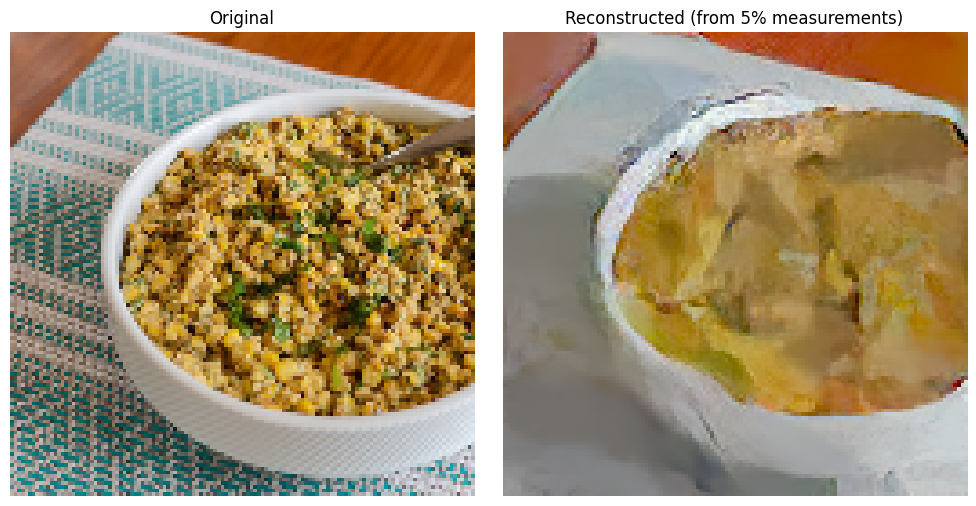

In [10]:
# Visualize original vs reconstruction
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Original image
original = test_img.permute([1, 2, 0]).cpu().numpy()
axs[0].imshow(gamma_correct(np.clip(original, 0, 1)))
axs[0].set_title('Original')
axs[0].axis('off')

# Reconstructed image
reconstructed = recon_result[-1]
axs[1].imshow(gamma_correct(np.clip(reconstructed, 0, 1)))
axs[1].set_title('Reconstructed (from 5% measurements)')
axs[1].axis('off')

plt.tight_layout()
plt.show()

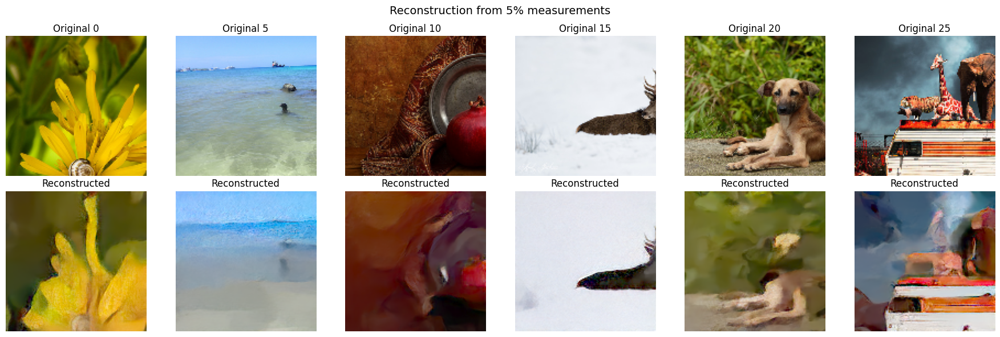

In [11]:
# Run reconstruction on multiple images and visualize together
n_examples = 6
example_indices = [0, 5, 10, 15, 20, 25]

fig, axs = plt.subplots(2, n_examples, figsize=(3 * n_examples, 6))

for i, idx in enumerate(example_indices):
    test_img = test_set_torch[idx]

    # Measure and reconstruct
    msmt = render.measure(test_img)
    recon = linear_inverse(model, render, msmt, stride=0)[-1]

    # Original
    original = test_img.permute([1, 2, 0]).cpu().numpy()
    axs[0, i].imshow(gamma_correct(np.clip(original, 0, 1)))
    axs[0, i].set_title(f'Original {idx}')
    axs[0, i].axis('off')

    # Reconstruction
    axs[1, i].imshow(gamma_correct(np.clip(recon, 0, 1)))
    axs[1, i].set_title('Reconstructed')
    axs[1, i].axis('off')

plt.suptitle(f'Reconstruction from {msmt_dim/im_dim*100:.0f}% measurements', fontsize=14)
plt.tight_layout()
plt.show()

### basic reconstruction routine

In [ ]:
def run_recon(render, denoiser, test_set):
    test_set_torch = torch.tensor(test_set).permute([0, 3, 1, 2]).to(device)

    im_size = test_set_torch.size()[1:]
    render = RenderMatrix(torch.tensor(render.astype('float32')),
                          im_size, device)

    recon_error = []
    for idx in tqdm(range(n_sample)):
        test = test_set_torch[idx]
        gt = test.permute([1, 2, 0]).cpu().numpy().flatten()

        msmt = render.measure(test)
        recon = linear_inverse(denoiser, render, msmt, stride=0)[-1]

        recon_error.append(np.linalg.norm(recon.flatten() - gt))

    return recon_error

### dichromacy

In [ ]:
def show_recon(render, denoiser, test_set):
    test_set_torch = torch.tensor(test_set).permute([0, 3, 1, 2]).to(device)

    im_size = test_set_torch.size()[1:]
    render = RenderMatrix(torch.tensor(render.astype('float32')),
                          im_size, device)

    fig, axs = plt.subplots(8, 5, figsize=(15, 24), sharex=True, sharey=True)
    all_recon = []
    for idx in tqdm(range(n_sample)):
        test = test_set_torch[idx]
        msmt = render.measure(test)
        recon = linear_inverse(denoiser, render, msmt, stride=0)[-1]

        n_avg = 10
        for ct in range(n_avg):
            recon += linear_inverse(denoiser, render, msmt, stride=0)[-1]

        recon /= (n_avg + 1)
        recon = gamma_correct(np.clip(recon, 0, 1))

        axs.flat[idx].imshow(recon)
        axs.flat[idx].axis('off')
        all_recon.append(recon)

    fig.tight_layout()
    return all_recon

In [ ]:
def show_original(render, denoiser, test_set):
    test_set_torch = torch.tensor(test_set).permute([0, 3, 1, 2]).to(device)

    im_size = test_set_torch.size()[1:]
    render = RenderMatrix(torch.tensor(render.astype('float32')),
                          im_size, device)

    fig, axs = plt.subplots(8, 5, figsize=(15, 24), sharex=True, sharey=True)
    all_recon = []
    for idx in tqdm(range(n_sample)):
        test = test_set_torch[idx]
        recon = test.permute([1, 2, 0]).cpu().numpy()
        recon = gamma_correct(np.clip(recon, 0, 1))

        axs.flat[idx].imshow(recon)
        axs.flat[idx].axis('off')
        all_recon.append(recon)

    fig.tight_layout()
    return all_recon

In [ ]:
# with open('./assets/render/render_deg0.npy', 'rb') as data:
#     u = np.load(data)
#     print(u.shape)
# originals = show_original(u.T, model, test_set)

In [ ]:
# file_path = './assets/render/renderProtanopia.mat'
# data = h5py.File(file_path, 'r')
#
# render = np.array(data['renderProtanopia'])
# u, s = compute_svd(render.T)
# protanopia = show_recon(u[s > 1.0, :], model, test_set)

In [ ]:
# file_path = './assets/render/renderDeuteranopia.mat'
# data = h5py.File(file_path, 'r')
#
# render = np.array(data['renderDeuteranopia'])
# u, s = compute_svd(render.T)
# deuteranopia = show_recon(u[s > 1.0, :], model, test_set)

In [ ]:
# file_path = './assets/render/renderTritanopia.mat'
# data = h5py.File(file_path, 'r')
#
# render = np.array(data['renderTritanopia'])
# u, s = compute_svd(render.T)
# tritanopia = show_recon(u[s > 1.0, :], model, test_set)